In [1]:
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from bokeh.layouts import column
from bokeh.plotting import figure, output_file, show
from bokeh.transform import jitter
from bokeh.resources import INLINE
import bokeh.io

bokeh.io.output_notebook(INLINE)

Loading BokehJS ...

In [2]:
pwd

'C:\\Users\\aidan\\Documents\\GitHub\\ML-Project\\Aidan'

In [3]:
price_data_clean = pd.read_csv('price_df_clean.csv')


C:\Users\aidan\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


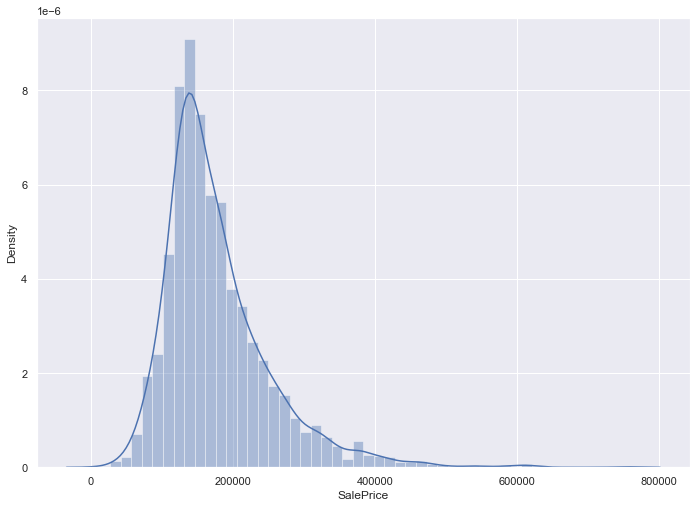

In [4]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.distplot(price_data_clean['SalePrice'])
plt.show()

In [5]:
#What are some of the original features (didn't require dummy variables) that seem to be correlated w/ sale price?

0.4902194289601562
0.7199813925858786
0.7905014467647514
0.5443699746148809
0.6349917651905107


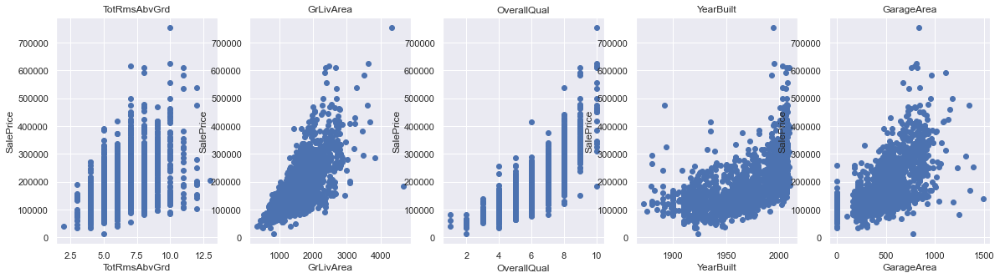

In [6]:
plt.figure(figsize=(20, 5))

features = ['TotRmsAbvGrd', 'GrLivArea', 'OverallQual', 'YearBuilt', 'GarageArea']
target = price_data_clean['SalePrice']

for i, col in enumerate(features):
    plt.subplot(1, len(features) , i+1)
    x = price_data_clean[col]
    y = target
    plt.scatter(x, y, marker='o')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    print(x.corr(y))

In [7]:
# Aside from GrLivArea, it looks like Overall Quality has a very strong linear correlation with sale price.
# But what are some of the factors that determine how a house's Overall Quality will be scored?
# And what insights might that provide us when advising clients on what to / not to spend money on during renovations?

In [8]:
#Exterior Quality and Exterior Condition vs Overall Quality

fig1 = figure(plot_width=600, plot_height=300, title='Exterior Quality and Overall Quality')
fig1.xgrid.grid_line_color = None
fig1.xaxis.ticker = price_data_clean['ExterQual_score']
fig1.circle(x=jitter('ExterQual_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)

fig2 = figure(plot_width=600, plot_height=300, title='Exterior Condition and Overall Quality')
fig2.xgrid.grid_line_color = None
fig2.xaxis.ticker = price_data_clean['ExterCond_score']
fig2.circle(x=jitter('ExterCond_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)




output_file("exter_overall_jitter.html")
show(column(fig1, fig2))



In [9]:
#BsmtQual and BsmntCond vs OverallQual


# Note: need to look into the MEANS for each bsmnt cond category. The vast majority of conds are 3's which is screwing up the...
# regressions, but it looks like you still do beter if you can achieve a higher score.

fig1 = figure(plot_width=600, plot_height=300, title='Basement Quality and Overall Quality')
fig1.xgrid.grid_line_color = None
fig1.xaxis.ticker = price_data_clean['BsmtQual_score']
fig1.circle(x=jitter('BsmtQual_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)

fig2 = figure(plot_width=600, plot_height=300, title='Basement Condition and Overall Quality')
fig2.xgrid.grid_line_color = None
fig2.xaxis.ticker = price_data_clean['BsmtCond_score']
fig2.circle(x=jitter('BsmtCond_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)




output_file("bsmt_overall_jitter.html")
show(column(fig1, fig2))


In [10]:
#HeatingQual vs Overall Qual

fig = figure(plot_width=600, plot_height=300, title='Heating Quality and Overall Quality')
fig.xgrid.grid_line_color = None
fig.xaxis.ticker = price_data_clean['heatingQC_score']
fig.circle(x=jitter('heatingQC_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)

    
output_file("heatingqc_overallqual_jitter.html")
show(fig)

In [11]:
#KitchenQual vs OverallQual

fig = figure(plot_width=600, plot_height=300, title='Kitchen Quality and Overall Quality')
fig.xgrid.grid_line_color = None
fig.xaxis.ticker = price_data_clean['KitchenQual_score']
fig.circle(x=jitter('KitchenQual_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)

    
output_file("kitchenqual_overallqual_jitter.html")
show(fig)


In [12]:
# Garage Quality and Garage Condition vs Overall Quality

fig5 = figure(plot_width=600, plot_height=300, title='Garage Quality and Overall Quality')
fig5.xgrid.grid_line_color = None
fig5.xaxis.ticker = price_data_clean['GarageQual_score']
fig5.circle(x=jitter('GarageQual_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)


fig6 = figure(plot_width=600, plot_height=300, title='Garage Condition and Overall Quality')
fig6.xgrid.grid_line_color = None
fig6.xaxis.ticker = price_data_clean['GarageCond_score']
fig6.circle(x=jitter('GarageCond_score', 0.4), y = 'OverallQual', size = 9, alpha = 0.4, source = price_data_clean)

output_file("garage_overall_jitter.html")
show(column(fig5, fig6))

